## STEP 1: Object detection

In [1]:
from ultralytics import YOLO
from transformers import AutoModelForCausalLM, AutoTokenizer, TextStreamer
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import random
from PIL import Image
import sys
from sentence_transformers import SentenceTransformer, util
from transformers import set_seed

sys.path.append('..')
from llm.prompts_generator import load_model
from sr_mechanism.llava_descriptor import extract_images_from_grid
from sr_mechanism.sentence_evaluator import *

../generative_images/89_horse.png


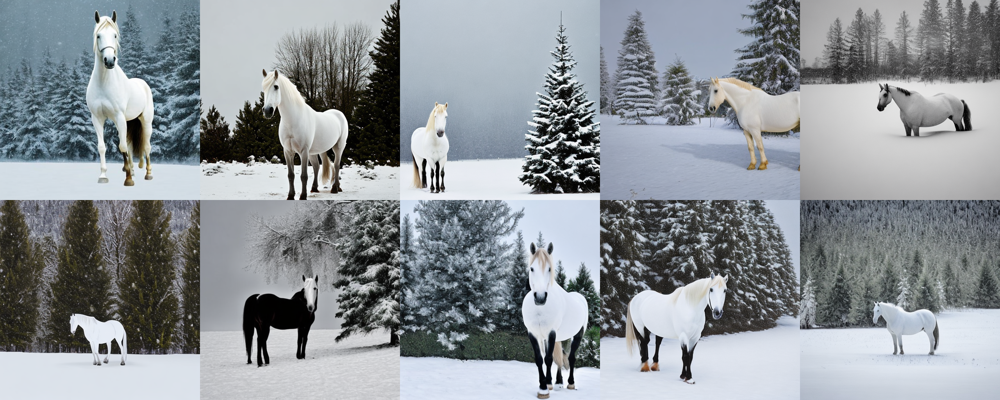

In [2]:
image_files = [f for f in os.listdir('../generative_images/') if f.endswith(('.png', '.jpg', '.jpeg'))]

img_file = os.path.join('../generative_images/', random.choice(image_files))
print(img_file)
image = Image.open(img_file)
image

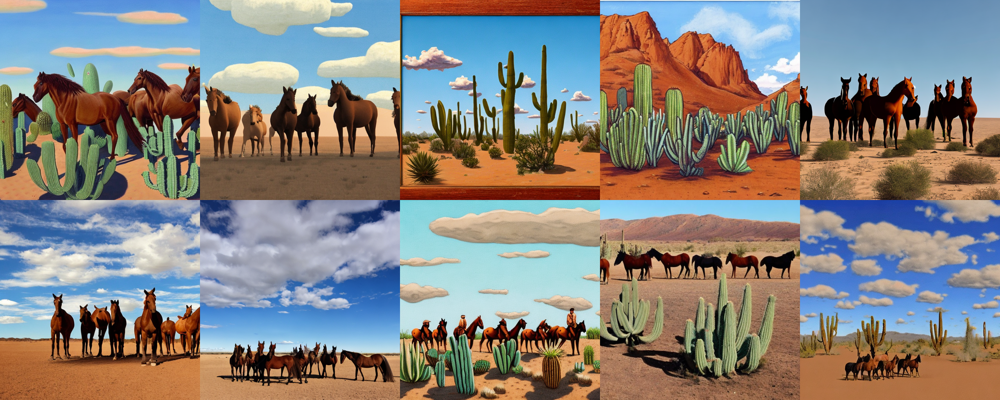

In [2]:
image_files = [f for f in os.listdir('../generative_images/') if f.endswith(('.png', '.jpg', '.jpeg'))]

img_file = os.path.join('../generative_images/', '71_horse.png')

image = Image.open(img_file)
image

## STEP 2: LLM self-judging

### let's prepare the data

In [3]:
def get_index_from_filename(filename):
    return int(filename.split('_')[0])

# Get the index from the chosen image file
indice = get_index_from_filename(os.path.basename(img_file))-1

# Rest of your code
prompt_list = []

with open('../generated_prompts.txt', 'r') as file:
    for line in file:
        class_, prompt = map(str.strip, line.split(';', 1))
        
        # Append [CLASS] and [PROMPT] to the 2D list
        prompt_list.append([class_, prompt])

if 0 <= indice < len(prompt_list):
    file_name = f"{indice + 1}_{prompt_list[indice][0]}.txt"
    
    # Read the content of the specified file
    with open(f'../generative_images_descriptions/{file_name}', 'r') as image_file:
        images_content = image_file.read()
        
    print(f'Class: {prompt_list[indice][0]}\n')
    print(f'Prompt: {prompt_list[indice][1]}\n')
    print(f'Image Content: \n{images_content}')
else:
    print(f"Index {indice} is out of range.")
    

Class: horse

Prompt: Eleven brown horses in a desert, a few cacti, a clear blue sky with a few cirrus clouds, a sense of stillness in the scene.

Image Content: 
image 1: This image is most likely a painting or drawing. It features a group of horses running through a desert landscape, with a sky background. The horses are positioned in various directions, creating a dynamic scene. There are a total of five horses in the image, with one horse located on the left side, two horses in the middle, and two horses on the right side. The horses are running in a line, giving the impression of a herd. The desert landscape is characterized by a sandy terrain and sparse vegetation, with a few cacti scattered throughout the scene. The sky in the background adds depth and atmosphere to the painting. Overall, the image is a captivating representation of the beauty and freedom of these majestic animals.
image 2: This image is most likely a drawing or art. A group of horses is standing in a field, wit

## YOLO-world to detect the class

In [5]:
sys.path.append('/home/safouane/Downloads/SRT2I/sr_mechanism')
from sr_mechanism.yolo_filter import yolo_filtering

In [6]:
class_name = [prompt_list[indice][0]]
model = YOLO('yolov8l-world.pt') 
model.set_classes(class_name)
class_name

['horse']

In [7]:
result = yolo_filtering(image, class_name)

result


0: 640x640 7 horses, 24.9ms
Speed: 4.9ms preprocess, 24.9ms inference, 24.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 7 horses, 20.4ms
Speed: 5.6ms preprocess, 20.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 20.2ms
Speed: 4.3ms preprocess, 20.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 11.3ms
Speed: 2.0ms preprocess, 11.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 10 horses, 21.6ms
Speed: 4.3ms preprocess, 21.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 8 horses, 11.2ms
Speed: 2.0ms preprocess, 11.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 10 horses, 10.2ms
Speed: 1.7ms preprocess, 10.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 9 horses, 10.0ms
Speed: 1.7ms preprocess, 10.0ms inference, 0.7ms postprocess per image a

[3, 4]


0: 640x640 7 horses, 10.2ms
Speed: 1.8ms preprocess, 10.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 7 horses, 12.0ms
Speed: 2.1ms preprocess, 12.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 9.9ms
Speed: 1.7ms preprocess, 9.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.4ms
Speed: 4.0ms preprocess, 16.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 10 horses, 10.3ms
Speed: 1.7ms preprocess, 10.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 8 horses, 9.8ms
Speed: 1.7ms preprocess, 9.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 10 horses, 14.4ms
Speed: 1.7ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 9 horses, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.8ms postprocess per image at sha


0: 640x640 6 horses, 10.6ms
Speed: 1.7ms preprocess, 10.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 5 horses, 10.3ms
Speed: 1.7ms preprocess, 10.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


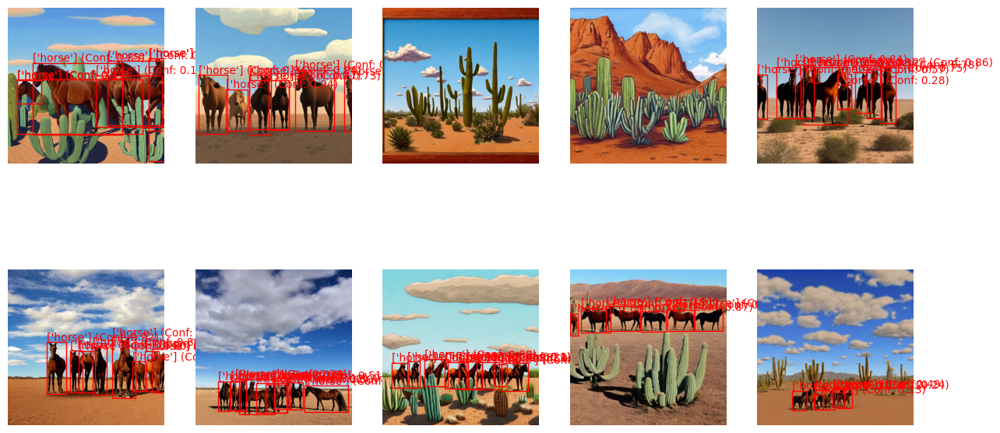

In [8]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

extracted_imgs = extract_images_from_grid(image, 2, 5)

fig, axs = plt.subplots(2, 5, figsize=(15, 8))
axs = axs.ravel()

no_detection = []

for i in range(10):
    res = model.predict(extracted_imgs[i], conf=0.1)
    
    if res[0].boxes.xyxy.cpu().numpy().any():
        for j, prediction in enumerate(res):
            boxes = prediction.boxes.xyxy.cpu().numpy()
            confidences = prediction.boxes.conf.cpu().numpy()

            for box, confidence in zip(boxes, confidences):
                x, y, w, h = box[:4]

                rect = patches.Rectangle((x, y), w - x, h - y, linewidth=1, edgecolor='r', facecolor='none')
                axs[i].add_patch(rect)

                # Display the class label and confidence value
                axs[i].text(x, y - 5, f"{class_name} (Conf: {confidence:.2f})", color='r')

        # Display the image without axes
        axs[i].imshow(extracted_imgs[i])
        axs[i].axis('off')
    else:
        no_detection.append(i+1)
        # Display the image without axes
        axs[i].imshow(extracted_imgs[i])
        axs[i].axis('off')

plt.show()


## Now LLM self-judging

In [9]:
#example of extracted lines and prompt
lines = images_content.split("\n")

let's remove the indices of images where no dog has been detected

In [10]:
lines_filtered = [line for i, line in enumerate(lines, start=1) if i not in result]
lines_filtered

['image 1: This image is most likely a painting or drawing. It features a group of horses running through a desert landscape, with a sky background. The horses are positioned in various directions, creating a dynamic scene. There are a total of five horses in the image, with one horse located on the left side, two horses in the middle, and two horses on the right side. The horses are running in a line, giving the impression of a herd. The desert landscape is characterized by a sandy terrain and sparse vegetation, with a few cacti scattered throughout the scene. The sky in the background adds depth and atmosphere to the painting. Overall, the image is a captivating representation of the beauty and freedom of these majestic animals.',
 'image 2: This image is most likely a drawing or art. A group of horses is standing in a field, with some of them facing the camera. The horses are of various sizes and are positioned in a line. The background features a blue sky with clouds, creating a se

In [11]:
scores_list = calculate_cosine_similarity_scores(prompt_list[indice][1], lines_filtered)

# Extract image numbers from lines_filtered
image_numbers = [int(line.split(":")[0].split()[-1]) for line in lines_filtered]

# Print image numbers and scores
for image_num, score in zip(image_numbers, scores_list):
    print(f"Image {image_num} - Score: {score}")


/home/safouane/miniconda3/envs/srt2i3/lib/python3.9/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


Image 1 - Score: 0.7414836883544922
Image 2 - Score: 0.6098238825798035
Image 5 - Score: 0.7505608201026917
Image 6 - Score: 0.7263534069061279
Image 7 - Score: 0.6265902519226074
Image 8 - Score: 0.6556240320205688
Image 9 - Score: 0.7289716005325317
Image 10 - Score: 0.7575883865356445


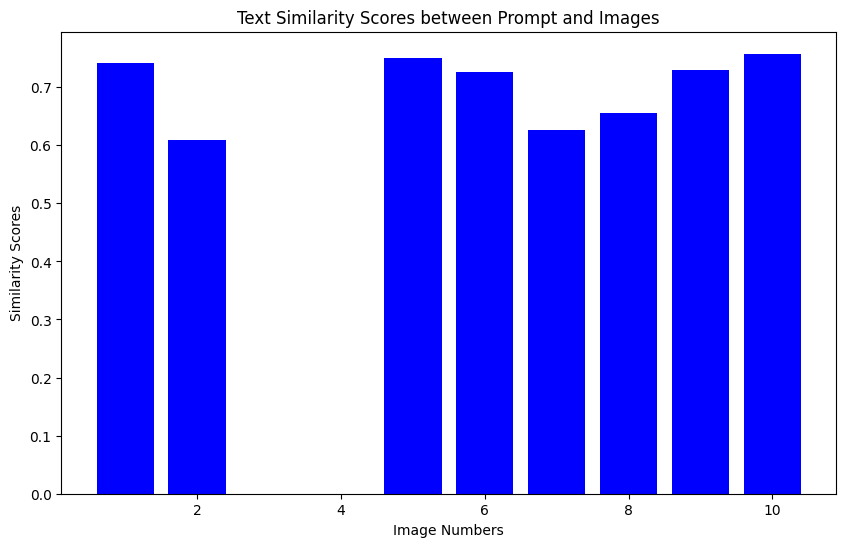

In [12]:
import matplotlib.pyplot as plt

# Plot the scores
plt.figure(figsize=(10, 6))
plt.bar(image_numbers, scores_list, color='blue')
plt.xlabel('Image Numbers')
plt.ylabel('Similarity Scores')
plt.title('Text Similarity Scores between Prompt and Images')
plt.show()

In [14]:
def keep_top_n_values(values, n=3):
    sorted_indices = sorted(range(len(values)), key=lambda k: values[k], reverse=True)
    top_indices = sorted_indices[:n]
    top_values = [values[i] for i in top_indices]
    return top_indices, top_values

top_indices, top_values = keep_top_n_values(scores_list, n=3)
top_ind = []
for index, value in zip(top_indices, top_values):
    print(f"Image {image_numbers[index]} - Score: {value}")
    top_ind.append(image_numbers[index])


Image 10 - Score: 0.7575883865356445
Image 5 - Score: 0.7505608201026917
Image 1 - Score: 0.7414836883544922


In [16]:
print("Top 3 images are: ", top_ind)

Top 3 images are:  [10, 5, 1]


In [17]:
img_desc = images_content.split('\n')
print(top_ind)
print(top_values)

[10, 5, 1]
[0.7575883865356445, 0.7505608201026917, 0.7414836883544922]


In [18]:
def extract_top_images(images_content, top_indices):
    # Split the images_content into individual image descriptions
    image_descriptions = images_content.split('\n')
    
    # Extract and keep only the content of the top images
    top_images_content = []
    for index in top_indices:
        try:
            top_images_content.append(image_descriptions[index-1])
        except IndexError:
            print(f"IndexError: Index {index} out of range for image_descriptions. Total images: {len(image_descriptions)}")
    
    # Join the content back into a single string
    top_images_content_combined = '\n'.join(top_images_content)

    return top_images_content_combined

# Example usage
top_images_content = extract_top_images(images_content, [index for index in top_ind])

# Print the content of the top images
print(top_images_content)

image 10: This image is most likely a drawing or art. A group of horses is walking across a desert landscape, with a total of 11 horses visible in the scene. The horses are spread out across the image, with some closer to the foreground and others further in the background. The horses are walking in a line, creating a sense of movement and direction. The desert landscape is characterized by a sandy terrain and sparse vegetation, with a few cacti scattered throughout the scene. The overall composition of the image is visually appealing and captures the essence of the desert environment.
image 5: This image is most likely a drawing or art. A group of horses is standing in a desert-like environment, with a blue sky in the background. There are a total of nine horses in the scene, with some standing closer to the foreground and others further in the background. The horses are positioned in various directions, creating a sense of depth and movement in the image. The colors used in the drawi

In [19]:
model, tokenizer = load_model("TheBloke/Mistral-7B-Instruct-v0.2-AWQ")

prompt = ""
prompt_template=f'''{prompt}'''

tokens = tokenizer(
    prompt_template,
    return_tensors='pt'
).input_ids.cuda()

# Same as the "self-rewarding language models" paper
generation_params = {
    "do_sample": True,
    "temperature": 0.7,
    "top_p": 0.95,
    "top_k": 40,
    "max_new_tokens": 512/4,
    "repetition_penalty": 1.1
}

streamer = TextStreamer(tokenizer, skip_prompt=True, skip_special_tokens=True)

SYSTEM_PROMPT = "<s>[SYS]Be critical in you analysis, very short and give importance to the realistic aspect of the image. Answer the question directly, justify your answer. do not give unecessary comments or discussions. Your answer should contain a single Image choice and don't talk about the other images.[/SYS]"


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [20]:
prompt = f"{SYSTEM_PROMPT}<s>[INST]which one of those diffusion-based generated images <<{top_images_content}>> is accuratly respecting the Given PROMPT: '{prompt_list[indice][1]}'. Please pay attention to details in the description and prompt, analyse the common features, colors, backgrounds and select a single Image out of all image description. you only answer should be the Updated PROMPT based on your analysis and make it very concise and very descriptive to the selected image. Follow this template for you answer: 'Image X: PROMPT.' where X is the number of selected image and PROMPT is the updated PROMPT with detailed scene, colors, background, position, orientation.[/INST]"

tokens = tokenizer(
    prompt,
    return_tensors='pt'
).input_ids.cuda()

generation_output = model.generate(
    tokens,
    pad_token_id=tokenizer.eos_token_id,
    streamer=streamer,
    **generation_params
)

Image 10: Eleven horses in a desert, a group of horses walking in a line, sandy terrain, sparse vegetation with cacti, clear blue sky with cirrus clouds.


In [45]:
prompt = f"{SYSTEM_PROMPT}<s>[INST]which one of those image descriptions <<{top_images_content}>> is the most realistic and accuratly respecting the Given PROMPT: '{prompt_list[indice][1]}'. Please pay attention to details in the description and prompt, analyse the common features, colors, backgrounds and select a single Image out of all image description. you only answer should be the Updated PROMPT based on your analysis and make it very concise and very descriptive to the selected image. Follow this template for you answer: 'Image X: PROMPT.' where X is the number of selected image and PROMPT is the updated PROMPT with detailed scene, colors, background, position, orientation.[/INST]"

tokens = tokenizer(
    prompt,
    return_tensors='pt'
).input_ids.cuda()

generation_output = model.generate(
    tokens,
    pad_token_id=tokenizer.eos_token_id,
    **generation_params
)
generated_prompts = tokenizer.decode(generation_output[0])
generated_prompts

"<s><s> [SYS]Be critical in you analysis, very short and give importance to the realistic aspect of the image. Answer the question directly, justify your answer. do not give unecessary comments or discussions. Your answer should contain a single Image choice and don't talk about the other images.[/SYS]<s> [INST]which one of those image descriptions <<image 10: This image is most likely a drawing or art. A black dog is walking across a grassy field, with a castle in the background. The dog appears to be looking at a fountain, which is located in the middle of the field. The castle is made of red bricks and has two towers, one on the left and one on the right side. The fountain is blue and has a circular shape. The grassy field is lush and green, providing a beautiful backdrop for the scene.\nimage 7: This image is most likely a drawing or art. A dog is standing in front of a large, pink castle with a moat. The dog appears to be looking at the castle, possibly intrigued by its grandeur. 

In [21]:
generated_prompts = tokenizer.decode(generation_output[0])
generated_prompts

"<s><s> [SYS]Be critical in you analysis, very short and give importance to the realistic aspect of the image. Answer the question directly, justify your answer. do not give unecessary comments or discussions. Your answer should contain a single Image choice and don't talk about the other images.[/SYS]<s> [INST]which one of those diffusion-based generated images <<image 10: This image is most likely a drawing or art. A group of horses is walking across a desert landscape, with a total of 11 horses visible in the scene. The horses are spread out across the image, with some closer to the foreground and others further in the background. The horses are walking in a line, creating a sense of movement and direction. The desert landscape is characterized by a sandy terrain and sparse vegetation, with a few cacti scattered throughout the scene. The overall composition of the image is visually appealing and captures the essence of the desert environment.\nimage 5: This image is most likely a dr

In [22]:
start_marker = '[/INST]'
end_marker = ':'

start_index = generated_prompts.find(start_marker) + len(start_marker)
end_index = generated_prompts.find(end_marker, start_index)

selected_image_description = generated_prompts[start_index:end_index].strip()

print(selected_image_description)


Image 10


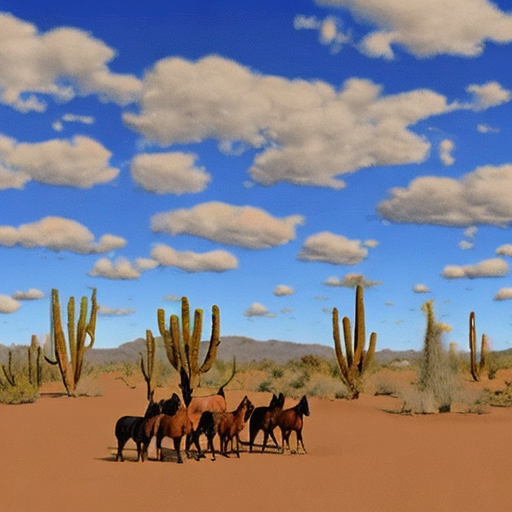

In [44]:
img = images[9]
img

10


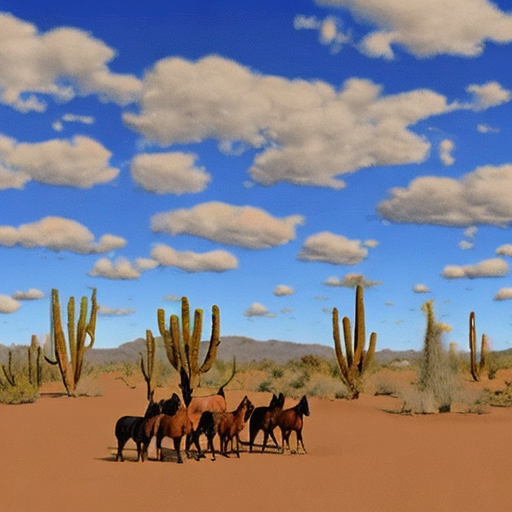

In [45]:
images = extract_images_from_grid(image, 2, 5)

image_nb = selected_image_description.split()[-1]
print(image_nb)

img = images[int(image_nb)-1]
img


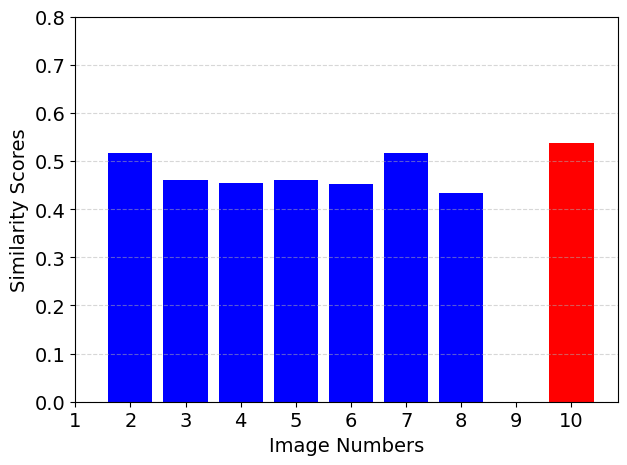

In [51]:
import matplotlib.pyplot as plt

# Assuming you have defined image_numbers, scores_list, and image_nb before this point

# Convert image_nb to the same data type as the elements in image_numbers
image_nb = type(image_numbers[0])(image_nb)

# Create a list of colors for each bar
bar_colors = ['red' if image_number == image_nb else 'blue' for image_number in image_numbers]

# Set the font size
plt.rcParams.update({'font.size': 14})

# Plot the scores with the specified colors
plt.figure(figsize=(7, 5))
plt.bar(image_numbers, scores_list, color=bar_colors)
plt.xlabel('Image Numbers')
plt.ylabel('Similarity Scores')

# Set x ticks from 1 to 10
plt.xticks(range(1, 11))

# Add horizontal grid lines
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Set y-axis limits between 0.0 and 0.8
plt.ylim(0.0, 0.8)

plt.savefig('similarity_score.pdf')

plt.show()
